# Comparison of Batch, Mini-Batch and Stochastic Gradient Descent

This notebook displays an animation comparing Batch, Mini-Batch and Stochastic Gradient Descent (introduced in Chapter 4). Thanks to [Daniel Ingram](https://github.com/daniel-s-ingram) who contributed this notebook.

<table align="left">
  <td>
    <a href="https://colab.research.google.com/github/hanchen92/THU-STAT-Deep-113-2-6189/blob/main/02_gradient_descent.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>
  </td>
  <td>
    <a target="_blank" href="https://kaggle.com/kernels/welcome?src=https://github.com/hanchen92/THU-STAT-Deep-113-2-6189/blob/main/02_gradient_descent.ipynb"><img src="https://kaggle.com/static/images/open-in-kaggle.svg" /></a>
  </td>
</table>

In [1]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

matplotlib.rc('animation', html='jshtml')

# Linear Regression

$$y_i=4+3*x_i+\varepsilon_i,\quad i=1,\dots,100$$

In [2]:
import numpy as np

m = 100
X = 2 * np.random.rand(m, 1)
X_b = np.c_[np.ones((m, 1)), X]
y = 4 + 3 * X + np.random.randn(m, 1)

$$\nabla L=\frac{2}{n}X^T(X\beta-y)$$

In [3]:
def batch_gradient_descent():
    n_iterations = 1000
    learning_rate = 0.05
    thetas = np.random.randn(2, 1)
    thetas_path = [thetas]
    for i in range(n_iterations):
        gradients = 2 * X_b.T @ (X_b @ thetas - y) / m
        thetas = thetas - learning_rate * gradients
        thetas_path.append(thetas)

    return thetas_path

$$\nabla L=\frac{2}{n}x_i^T(x_i^T\beta-y_i)$$

In [4]:
def stochastic_gradient_descent():
    n_epochs = 50
    thetas = np.random.randn(2, 1)
    thetas_path = [thetas]
    for epoch in range(n_epochs):
        for i in range(m):
            random_index = np.random.randint(m)
            xi = X_b[random_index:random_index+1]
            yi = y[random_index:random_index+1]
            gradients = 2 * xi.T @ (xi @ thetas - yi)
            eta = 0.05 
            thetas = thetas - eta * gradients
            thetas_path.append(thetas)

    return thetas_path

$$\nabla L=\frac{2}{n}X_{\text{part}}^T(X_{\text{part}}^T\beta-y_i)$$

In [5]:
def mini_batch_gradient_descent():
    n_iterations = 50
    minibatch_size = 20
    thetas = np.random.randn(2, 1)
    thetas_path = [thetas]
    for epoch in range(n_iterations):
        shuffled_indices = np.random.permutation(m)
        X_b_shuffled = X_b[shuffled_indices]
        y_shuffled = y[shuffled_indices]
        for i in range(0, m, minibatch_size):
            xi = X_b_shuffled[i : i + minibatch_size]
            yi = y_shuffled[i : i + minibatch_size]
            gradients = 2 * xi.T @ (xi @ thetas - yi) / minibatch_size
            eta = 0.05
            thetas = thetas - eta * gradients
            thetas_path.append(thetas)

    return thetas_path

In [13]:
def compute_mse(theta):
    return ((X_b @ theta - y)**2).sum() / m

In [14]:
theta0, theta1 = np.meshgrid(np.arange(2, 5, 0.01), np.arange(2, 5, 0.01))
r, c = theta0.shape
cost_map = np.array([[0 for _ in range(c)] for _ in range(r)])
for i in range(r):
    for j in range(c):
        theta = np.array([[theta0[i,j]], [theta1[i,j]]])
        cost_map[i,j] = compute_mse(theta)

In [15]:
exact_solution = np.linalg.inv(X_b.T @ X_b) @ X_b.T @ y
bgd_thetas = np.array(batch_gradient_descent())
sgd_thetas = np.array(stochastic_gradient_descent())
mbgd_thetas = np.array(mini_batch_gradient_descent())

In [16]:
bgd_len = len(bgd_thetas)
sgd_len = len(sgd_thetas)
mbgd_len = len(mbgd_thetas)
n_iter = min(bgd_len, sgd_len, mbgd_len)

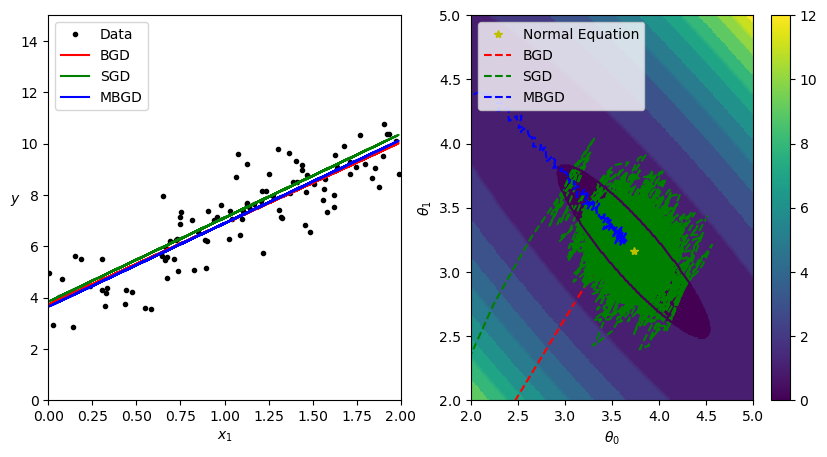

In [17]:
fig = plt.figure(figsize=(10, 5))
data_ax = fig.add_subplot(121)
cost_ax = fig.add_subplot(122)

data_ax.plot(X, y, 'k.')
cost_ax.plot(exact_solution[0,0], exact_solution[1,0], 'y*')

i = -1
[bgd_data_plot] = data_ax.plot(X, X_b @ bgd_thetas[i,:], 'r-')
[bgd_cost_plot] = cost_ax.plot(bgd_thetas[:i,0], bgd_thetas[:i,1], 'r--')

[sgd_data_plot] = data_ax.plot(X, X_b @ sgd_thetas[i,:], 'g-')
[sgd_cost_plot] = cost_ax.plot(sgd_thetas[:i,0], sgd_thetas[:i,1], 'g--')

[mbgd_data_plot] = data_ax.plot(X, X_b @ mbgd_thetas[i,:], 'b-')
[mbgd_cost_plot] = cost_ax.plot(mbgd_thetas[:i,0], mbgd_thetas[:i,1], 'b--')

data_ax.set_xlim([0, 2])
data_ax.set_ylim([0, 15])
cost_ax.set_xlim([2, 5])
cost_ax.set_ylim([2, 5])

data_ax.set_xlabel(r'$x_1$')
data_ax.set_ylabel(r'$y$', rotation=0)
cost_ax.set_xlabel(r'$\theta_0$')
cost_ax.set_ylabel(r'$\theta_1$')

data_ax.legend(('Data', 'BGD', 'SGD', 'MBGD'), loc="upper left")
cost_ax.legend(('Normal Equation', 'BGD', 'SGD', 'MBGD'), loc="upper left")

cost_ax.plot(exact_solution[0,0], exact_solution[1,0], 'y*')
cost_img = cost_ax.pcolor(theta0, theta1, cost_map, shading='auto',)
cost_ax.contour(theta0, theta1, cost_map)
fig.colorbar(cost_img)
plt.show()

In [18]:
def animate(i):
    bgd_data_plot.set_data(X, X_b @ bgd_thetas[i,:])
    bgd_cost_plot.set_data(bgd_thetas[:i,0], bgd_thetas[:i,1])

    sgd_data_plot.set_data(X, X_b @ sgd_thetas[i,:])
    sgd_cost_plot.set_data(sgd_thetas[:i,0], sgd_thetas[:i,1])

    mbgd_data_plot.set_data(X, X_b @ mbgd_thetas[i,:])
    mbgd_cost_plot.set_data(mbgd_thetas[:i,0], mbgd_thetas[:i,1])

In [12]:
FuncAnimation(fig, animate, frames=n_iter//3)

# Logistic Regression

In [211]:
m = 100
X = 2 * np.random.rand(m, 1)
X_b = np.c_[np.ones((m, 1)), X]


z = -1 + 1 * X 
p = np.exp(tmp)/(1+np.exp(tmp))
y = np.random.binomial(1,p)

In [316]:
def glm_batch_gradient_descent():
    n_iterations = 5000
    learning_rate = 0.1
    thetas = np.random.randn(2, 1)
    thetas_path = [thetas]
    for i in range(n_iterations):
        z =  X_b@thetas
        a = np.exp(z)/(1+np.exp(z))

        dl_da = a-y
        da_dz = a*(1-a)
        dz_dbeta = X_b

        
        gradients = X_b.T @ (dl_da*da_dz) / m
        thetas = thetas - learning_rate * gradients
        thetas_path.append(thetas)

    return thetas_path

In [ ]:
def compute_coss_entropy(theta):
    z = X_b@theta
    p = np.exp(z)/(1+np.exp(np.exp(z)))
    return -1*(y*np.log(p)+(1-y)*np.log(1-p)).sum()/m

In [329]:
glm_theta0, glm_theta1 = np.meshgrid(np.arange(-2, 0, 0.005), np.arange(0, 2, 0.005))
r, c = glm_theta0.shape
glm_cost_map = np.array([[0 for _ in range(c)] for _ in range(r)])
for i in range(r):
    for j in range(c):
        glm_theta = np.array([[glm_theta0[i,j]], [glm_theta1[i,j]]])
        glm_cost_map[i,j] = compute_coss_entropy(glm_theta)

In [330]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(random_state=0, C=np.inf).fit(X, y)
glm_exact_solution = np.array([clf.intercept_,clf.coef_[0]])
glm_exact_solution

glm_bgd_thetas = np.array(glm_batch_gradient_descent())

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [331]:
glm_exact_solution

array([[-1.49970799],
       [ 1.54242331]])

In [332]:
glm_bgd_thetas[-1]

array([[-1.44459474],
       [ 1.51986252]])

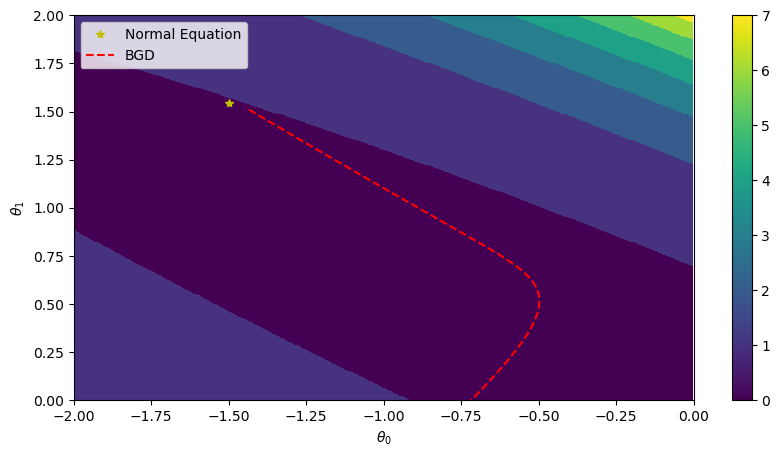

In [333]:
fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(glm_exact_solution[0,0], glm_exact_solution[1,0], 'y*')

i = -1
[glm_bgd_cost_plot]  = ax.plot(glm_bgd_thetas[:i,0], glm_bgd_thetas[:i,1], 'r--')

ax.set_xlim([-2, 0])
ax.set_ylim([0, 2])


ax.set_xlabel(r'$\theta_0$')
ax.set_ylabel(r'$\theta_1$')

ax.legend(('Normal Equation', 'BGD', 'SGD', 'MBGD'), loc="upper left")

cost_img = ax.pcolor(glm_theta0, glm_theta1, glm_cost_map, shading='auto',)
cost_ax.contour(glm_theta0, glm_theta1, glm_cost_map)
fig.colorbar(cost_img)
plt.show()

In [327]:
def animate(i):
    glm_bgd_cost_plot.set_data(glm_bgd_thetas[:(30*i),0], glm_bgd_thetas[:(30*i),1])

In [328]:
FuncAnimation(fig, animate, frames=n_iter//(3))